In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

n_sources = 1000

testObj = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2, zogyImageSpace=False)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496242902547 0.496864203708
Variable source: 11 430.532014184 434.414017796 0 1753.62481734
Variable source: 2 427.660810318 419.100929438 0 1753.62481734
Variable source: 4 358.467452217 410.92744144 0 1753.62481734
Variable source: 8 316.562712626 116.894212295 0 1753.62481734
Variable source: 13 403.10653814 219.668213309 0 1753.62481734
Variable source: 1 387.709867276 181.352731522 0 1753.62481734
Variable source: 0 127.628652422 282.460928881 0 1753.62481734
Variable source: 6 343.291765499 352.648316392 0 1753.62481734
Variable source: 5 171.4583324 209.804682288 0 1753.62481734
Variable source: 3 193.456129542 274.216491496 0 1753.62481734
{'Zogy': {'FP': 55, 'FN': 2, 'TP': 8}, 'ALstack': {'FP': 4, 'FN': 1, 'TP': 9}, 'SZogy': {'FP': 48, 'FN': 1, 'TP': 9}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}


A&L(dec): stats(mean=0.15083465, stdev=24.908756, min=-154.18733, max=213.73967)
Zogy: stats(mean=0.013960622063857295, stdev=25.376515307403565, min=-723.90785520588963, max=856.20339198031274)
A&L(dec) - Zogy: stats(mean=0.068423798977562095, stdev=2.9176787061942737, min=-734.53949563562412, max=681.93619459187596)
A&L(dec) - A&L: stats(mean=-0.030047657, stdev=6.868228, min=-45.405457, max=52.115646)
Scorr: stats(mean=4.2905320367637243e-06, stdev=0.0002761502860405952, min=-0.012535435061123713, max=0.013934042618754939)
Scorr_var: stats(mean=0.00025029846781114153, stdev=2.1016408460745906e-06, min=0.0002446843442184825, max=0.0016004979428343937)


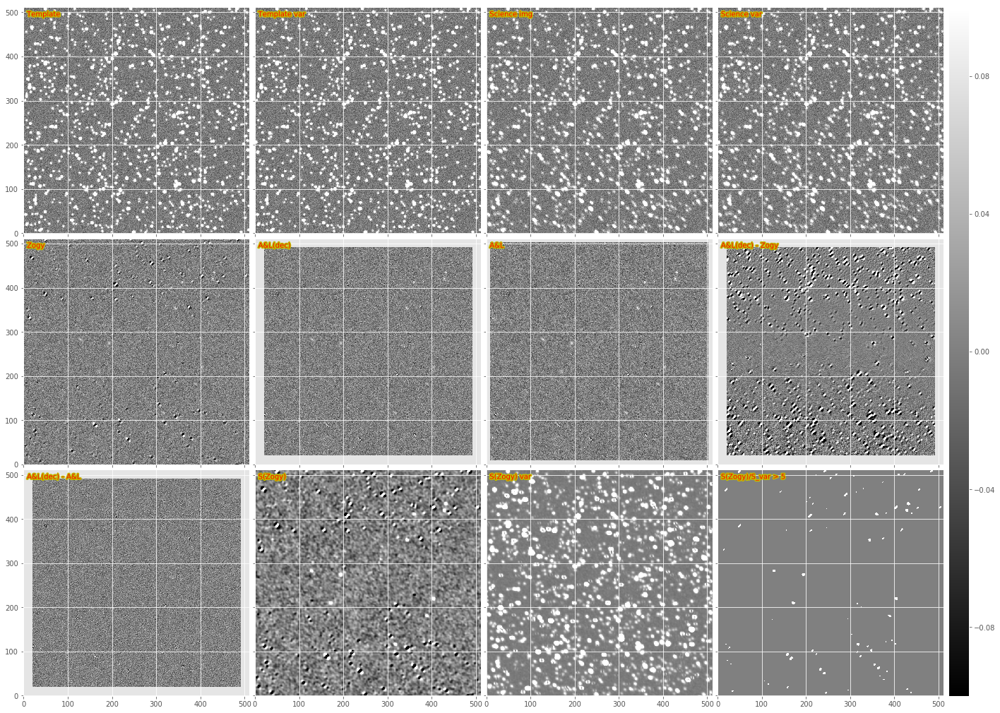

In [3]:
testObj.doPlot(imScale=6, include_Szogy=True);

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496242902547 0.496864203708
Variable source: 11 430.532014184 434.414017796 0 1753.62481734
Variable source: 2 427.660810318 419.100929438 0 1753.62481734
Variable source: 4 358.467452217 410.92744144 0 1753.62481734
Variable source: 8 316.562712626 116.894212295 0 1753.62481734
Variable source: 13 403.10653814 219.668213309 0 1753.62481734
Variable source: 1 387.709867276 181.352731522 0 1753.62481734
Variable source: 0 127.628652422 282.460928881 0 1753.62481734
Variable source: 6 343.291765499 352.648316392 0 1753.62481734
Variable source: 5 171.4583324 209.804682288 0 1753.62481734
Variable source: 3 193.456129542 274.216491496 0 1753.62481734
{'Zogy': {'FP': 48, 'FN': 2, 'TP': 8}, 'ALstack': {'FP': 4, 'FN': 1, 'TP': 9}, 'SZogy': {'FP': 34, 'FN': 1, 'TP': 9}, 'ALstack_decorr': {'FP': 0, 'FN': 0, 'TP': 10}}
A&L(dec): stats(mean=0.15083465, stdev=24.908756, min=-15

diffimTests/diffimTests.py:106: RuntimeWarning: invalid value encountered in greater
  imagesToPlot.append((self.S_Zogy.im / self.S_Zogy.var > 5.) * 10.0)


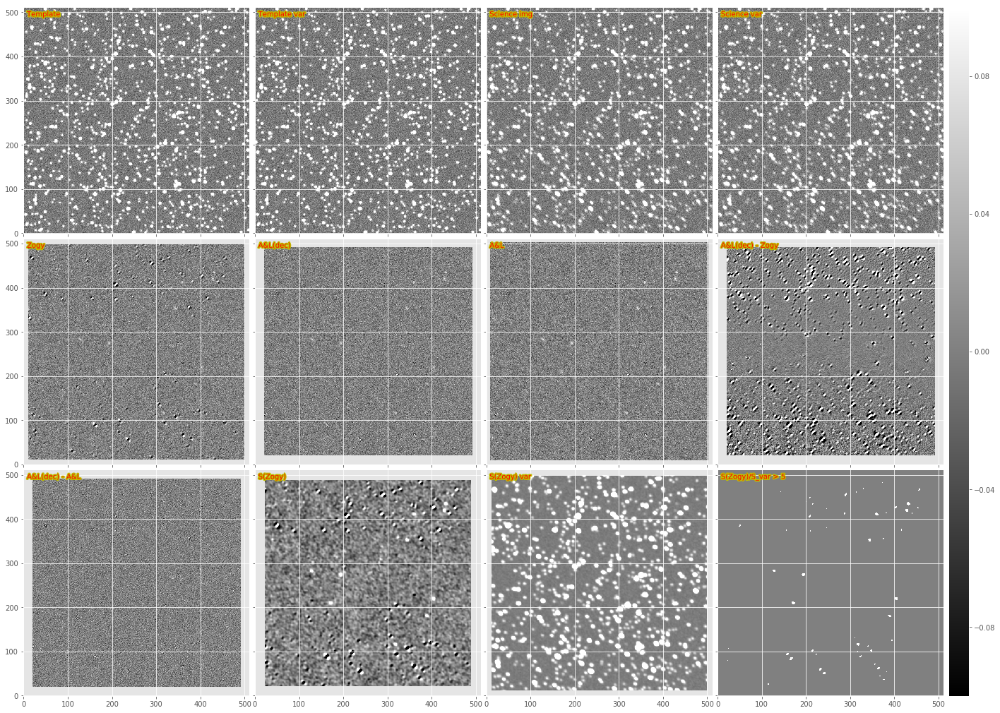

In [4]:
testObj2 = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res2 = testObj2.runTest(spatialKernelOrder=2, zogyImageSpace=True)
print res2
testObj2.doPlot(imScale=6, include_Szogy=True);

In [34]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        imageSpace = kwargs.get('inImageSpace', False)
        doScorr = kwargs.get('Scorr', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
            #print 'HERE:', center.getX(), center.getY(), subExp.getPsf().computeShape(center).getDeterminantRadius()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if False and psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()

        if not doScorr:
            D_zogy, var_zogy = dit.zogy.computeZogy(subarr1, subarr2, subvar1, subvar2,
                              psf1, psf2, sig1=sig1, sig2=sig2, inImageSpace=imageSpace)

            tmpIM.getImage().getArray()[:, :] = D_zogy
            tmpIM.getVariance().getArray()[:, :] = var_zogy

        else:
            S, S_var, Pd, Fd = dit.zogy.computeZogyScorr(subarr1, subarr2, subvar1, subvar2, 
                              psf1, psf2, sig1=sig1, sig2=sig2, xVarAst=0., yVarAst=0., 
                              inImageSpace=imageSpace, padSize=7)

            tmpIM.getImage().getArray()[:, :] = S
            tmpIM.getVariance().getArray()[:, :] = S_var

        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


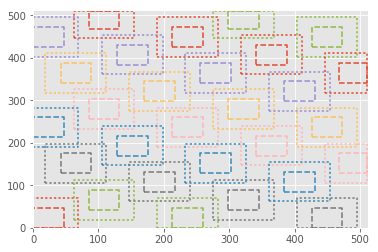

In [6]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
task._generateGrid(exposure, forceEvenSized=True)
task._plotBoxes(exposure.getBBox(), 5)

In [7]:
newExp = task.run(exposure, template=template, forceEvenSized=True).exposure #, variablePsf=testObj.variablePsf)

In [8]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, forceEvenSized=True, sigmas=[sig1, sig2]).exposure

17.4095 17.4774


In [9]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], forceEvenSized=True, inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


diffimTests/imageMapReduce.py:268: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:269: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [10]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def rb(array, width=5):  # remove border
    shape = array.shape
    return array[width:(shape[0]-width), width:(shape[1]-width)]

stats(mean=5.4601817, stdev=20.93199, min=-82.0, max=4907.0)
stats(mean=-0.020599065, stdev=25.390928, min=-952.76465, max=856.53113)
stats(mean=-0.019313224, stdev=25.394913, min=-954.62823, max=856.20343)
stats(mean=0.043385409, stdev=25.348244, min=-723.9093, max=856.20648)
stats(mean=2.6341398, stdev=10.216296, min=-37.60141, max=4272.4087)
stats(mean=-4.5120135656661755e-05, stdev=0.017250664251986694, min=-938.11998493022702, max=309.31580777137236)
stats(mean=-5.2209422749226407e-08, stdev=4.2721952557100234e-05, min=-939.98357135600827, max=309.32429928748564)
stats(mean=2.360414473550099e-06, stdev=0.0025944596338202219, min=-0.054339892191295647, max=0.054056340172337514)


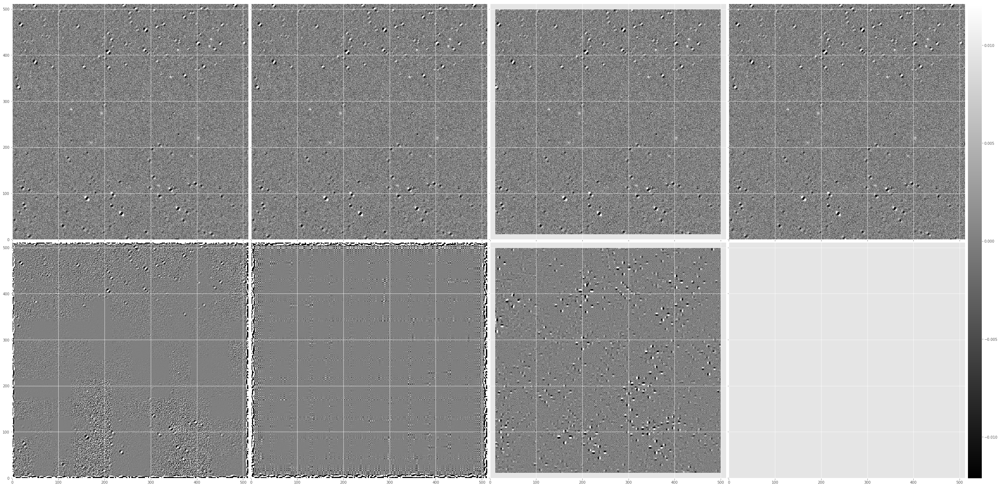

In [11]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

try with *input* variable Psf

Now for S_corr

In [12]:
# Need even bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 5
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExp       = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=False, forceEvenSized=True).exposure
newExp_Scorr = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=True, forceEvenSized=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


stats(mean=5.6429003e-06, stdev=0.00025430671, min=-0.0015754167, max=0.0033080089)
stats(mean=0.0002541166, stdev=1.6035901e-05, min=0.00022245682, max=0.00096817059)
stats(mean=4.2905320367637243e-06, stdev=0.0002761502860405952, min=-0.012535435061123713, max=0.013934042618754939)
stats(mean=0.00025029846781114153, stdev=2.1016408460745906e-06, min=0.0002446843442184825, max=0.0016004979428343937)
stats(mean=-6.2638173130563633e-07, stdev=4.3627968505957407e-05, min=-0.014168776289122798, max=0.012622323091760769)


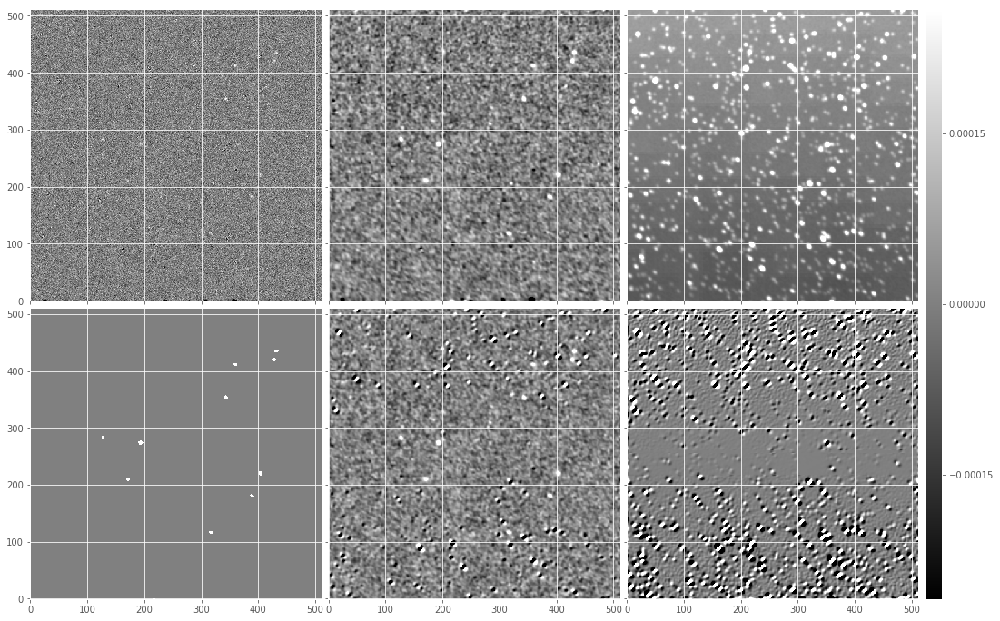

In [13]:
Sim = ga(newExp_Scorr)
Svar = gv(newExp_Scorr)
print dit.computeClippedImageStats(rb(Sim))
print dit.computeClippedImageStats(rb(Svar))
print dit.computeClippedImageStats(testObj.S_Zogy.im)
print dit.computeClippedImageStats(testObj.S_Zogy.var)
print dit.computeClippedImageStats(rb(Sim-testObj.S_Zogy.im))
dit.plotImageGrid((ga(newExp), Sim, Svar, (Sim/Svar > 5.0) * 1.0, testObj.S_Zogy.im, Sim-testObj.S_Zogy.im), imScale=6)

A&L(dec): stats(mean=0.15083465, stdev=24.908756, min=-154.18733, max=213.73967)
Zogy: stats(mean=0.011139289, stdev=24.903847, min=-1143.9648, max=182.07242)
A&L(dec) - Zogy: stats(mean=0.080757052, stdev=2.4403255, min=-48.465687, max=134.29567)
A&L(dec) - A&L: stats(mean=-0.030047657, stdev=6.868228, min=-45.405457, max=52.115646)
Scorr: stats(mean=5.0399813e-06, stdev=0.00025490604, min=-0.010556919, max=0.0033080089)
Scorr_var: stats(mean=0.00025413741, stdev=1.6219619e-05, min=0.00022245682, max=0.00096817059)


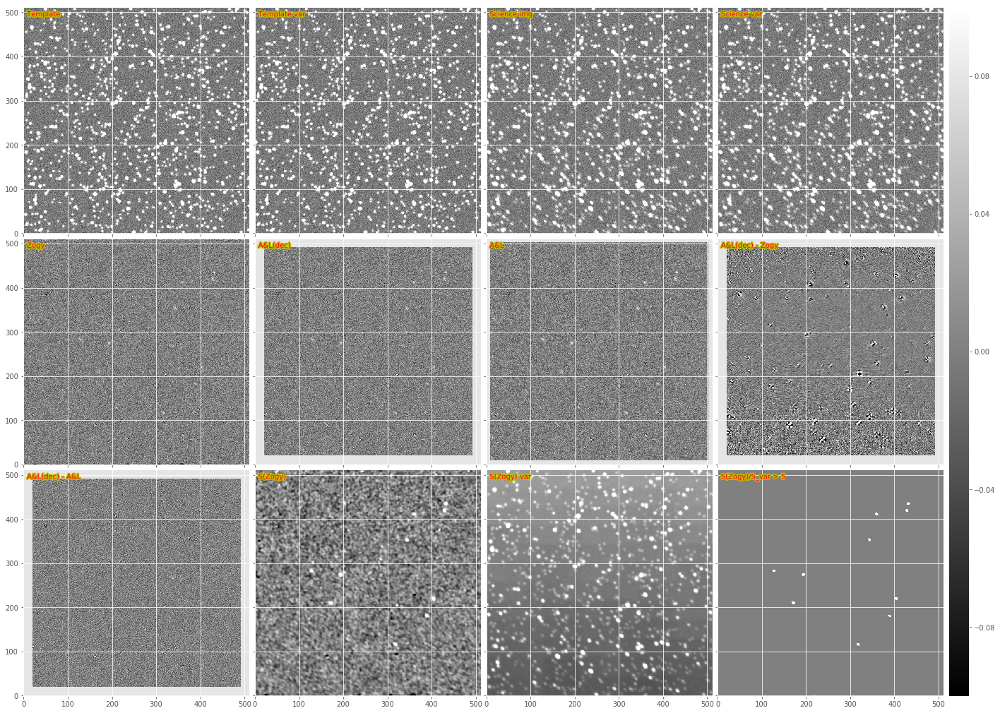

In [14]:
testObj2 = testObj.clone()
testObj2.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj2.D_Zogy = dit.Exposure(ga(newExp), dit.psf.afwPsfToArray(newExp.getPsf()), gv(newExp))
testObj2.doPlot(imScale=6, include_Szogy=True);

Time to try measured PSFs again...

In [15]:
exposure2 = testObj.im2.asAfwExposure()
res = dit.tasks.doMeasurePsf(exposure2, spatialOrder=1)
psf = res.psf
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
res = dit.tasks.doMeasurePsf(template2, spatialOrder=1)
psf = res.psf
template2.setPsf(psf)

5.98031051755e-05 0.000106779783416 0.000137625128207 7.96239264071e-05
2.18563406464
1.7844893799


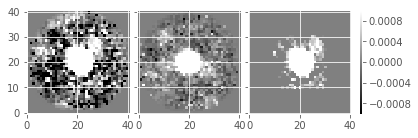

In [25]:
import lsst.afw.geom as afwGeom
psf = exposure2.getPsf()

psf1 = psf.computeImage(afwGeom.Point2D(20., 20.)).getArray()
psf1b = psf1.copy()
psf1b[psf1b < 0] = 0
print psf1b[0:10,:].mean(), psf1b[:,0:10].mean(), psf1b[31:41,:].mean(), psf1b[:,31:41].mean()
psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
psf1b /= psf1b.sum()

print psf.computeShape(afwGeom.Point2D(20., 20.)).getDeterminantRadius()
print psf.computeShape(afwGeom.Point2D(500., 500.)).getDeterminantRadius()

dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), psf.computeImage(afwGeom.Point2D(500.,500.)), psf1b),
                 clim=(-0.001, 0.001))

1.6114091219
1.60114491969


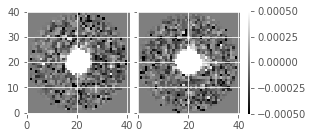

In [17]:
psf = template2.getPsf()
print psf.computeShape(afwGeom.Point2D(20., 20.)).getDeterminantRadius()
print psf.computeShape(afwGeom.Point2D(500., 500.)).getDeterminantRadius()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), psf.computeImage(afwGeom.Point2D(500.,500.))))

In [35]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 10
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExp2_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 10.0, 'borderSizeY': 10.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


A&L(dec): stats(mean=0.15083465, stdev=24.908756, min=-154.18733, max=213.73967)
Zogy: stats(mean=-0.77954757, stdev=26.470266, min=-756.58813, max=560.93243)
A&L(dec) - Zogy: stats(mean=0.94067895, stdev=30.080408, min=-246.88762, max=542.94904)
A&L(dec) - A&L: stats(mean=-0.030047657, stdev=6.868228, min=-45.405457, max=52.115646)
Scorr: stats(mean=-5.1609713e-05, stdev=0.00035520585, min=-0.01791033, max=0.012040343)
Scorr_var: stats(mean=0.00028083599, stdev=9.5776577e-06, min=0.00025974432, max=0.001047746)


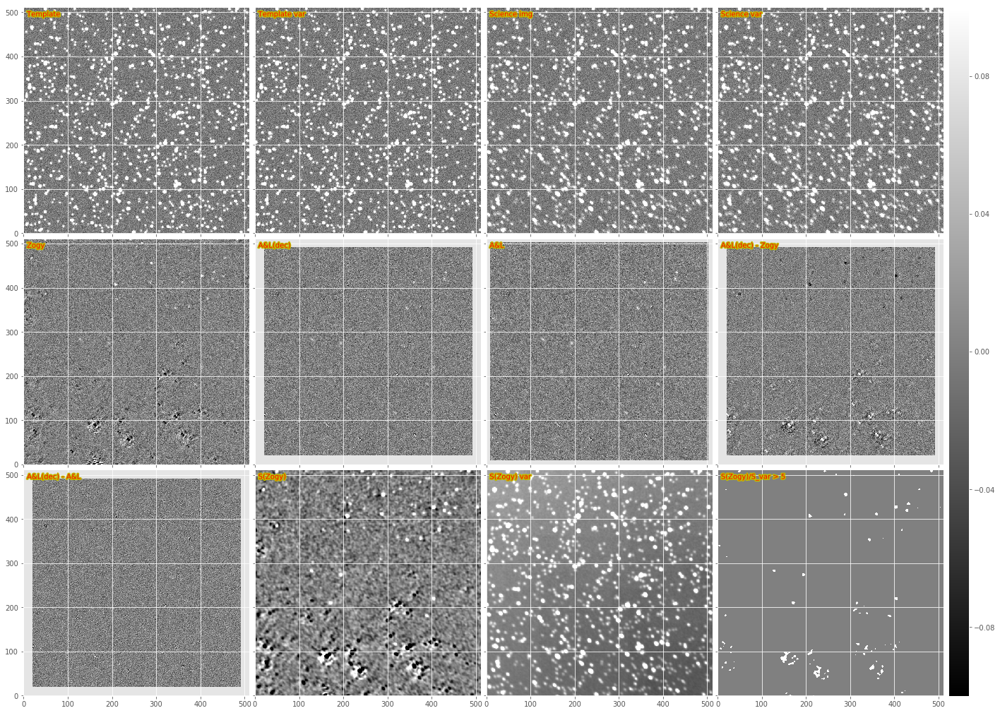

In [36]:
#print dit.computeClippedImageStats(ga(exposure2))
#print dit.computeClippedImageStats(ga(newExp))
#print dit.computeClippedImageStats(ga(newExp2))
#print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
#print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
#dit.plotImageGrid((ga(newExp2), ga(newExp), testObj.S_Zogy.im,
#                  ga(newExp2) - testObj.S_Zogy.im), imScale=12)
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExp2), dit.psf.afwPsfToArray(newExp2.getPsf()), gv(newExp2))
testObj2.S_Zogy = dit.Exposure(ga(newExp2_Scorr), dit.psf.afwPsfToArray(newExp2_Scorr.getPsf()), gv(newExp2_Scorr))
testObj2.doPlot(imScale=6, include_Szogy=True);